In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

#/kaggle/input/seti-data/primary_small

In [2]:
import pandas as pd
import numpy as np
import random
from random import randint
import time


import torch
import torch.nn as nn
from torch.utils.data import Dataset,DataLoader
import torchvision.transforms as T
from torchvision import models
import torch.optim as optim

from PIL import Image
import seaborn as sns
import os
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2


from sklearn.metrics import accuracy_score, classification_report,roc_auc_score
from sklearn.metrics import confusion_matrix

import warnings
warnings.filterwarnings('ignore')


In [3]:
class SetiDataset(Dataset):
    def __init__(self,directory,train = False):
        self.images,self.labels = self.get_images(directory)

        norm_mean = [0.485, 0.456, 0.406]
        norm_std = [0.229, 0.224, 0.225]
        if train is True:
           
            self.transform = T.Compose([
                T.Resize((224,224)),
                # T.CenterCrop(224),
                # T.RandomCrop(224),
                # T.RandomHorizontalFlip(p=0.5),
                # T.Grayscale(num_output_channels=3),
                T.ToTensor(),
                # T.Normalize(norm_mean, norm_std),
            ])
        else:
            self.transform = T.Compose([
                T.Resize((224, 224)),
                T.ToTensor(),
                # T.Normalize(norm_mean,norm_std)
            ])
            

    def __len__(self):
        return len(self.images)


    def __getitem__(self,index):
        image=self.images[index]
        label = self.labels[index]

        image = Image.fromarray(image)
        image = self.transform(image)

        
        label = torch.tensor(label,dtype=torch.long)

        return image,label
        


    def get_images(self,directory):
        images=[]
        labels=[]

        label_mapping={
            'brightpixel':0,
            'narrowband':1,
            'narrowbanddrd':2,
            'noise':3,
            'squarepulsednarrowband':4,
            'squiggle':5,
            'squigglesquarepulsednarrowband':6
        }

        for label in os.listdir(directory):
            if label in label_mapping:
                for image_files in os.listdir(os.path.join(directory,label)):
                    image_path = os.path.join(directory,label,image_files)
                    image=cv2.imread(image_path)
                    images.append(image)
                    labels.append(label_mapping[label])
    
        return images, labels

In [4]:

def get_classlabels(class_code):
    label_mapping={
            0:'brightpixel',
            1:'narrowband',
            2:'narrowbanddrd',
            3:'noise',
            4:'squarepulsednarrowband',
            5:'squiggle',
            6:'squigglesquarepulsednarrowband'
        }
    return label_mapping[class_code]

In [5]:
def get_class_labels():
    return ['brightpixel','narrowband','narrowbanddrd','noise','squarepulsednarrowband','squiggle','squigglesquarepulsednarrowband']

In [6]:
def draw_hist(data_set, title):
    labels = []

    for _, label in data_set:
        label_name = get_classlabels(label.item()) #.item() to remove tensor
        labels.append(label_name)

    sns.set(style="whitegrid")
    ax = sns.countplot(x=labels,palette="Set2")

    # Get counts per label in correct order
    counts = pd.Series(labels).value_counts()
    
    # Put text inside bars
    for p in ax.patches:
        label = ax.get_xticklabels()[int(p.get_x() + p.get_width() / 2)].get_text()
        count = int(p.get_height())

        ax.text(
            p.get_x() + p.get_width() / 2,
            p.get_height() / 2,
            f"{label}\n({count})",
            ha="center",
            va="center",
            fontsize=9,
            color="white",
            weight="bold",
            rotation=90
        )

    # Remove x-axis labels completely
    ax.set_xticklabels([])
    ax.set_xlabel("")

    plt.title(f"Class Distribution Histogram of {title}")
    plt.tight_layout()
    plt.show()


def draw_hist_all(data_set, title, ax):
    labels = []

    for _, label in data_set:
        labels.append(get_classlabels(label.item()))

    counts = pd.Series(labels).value_counts()
    order = counts.index.tolist()

    sns.countplot(
        x=labels,
        order=order,
        palette="Set2",
        ax=ax
    )

    # Put text inside bars (SAFE)
    for p, class_name in zip(ax.patches, order):
        count = int(p.get_height())

        ax.text(
            p.get_x() + p.get_width() / 2,
            p.get_height() / 2,
            f"{class_name}\n({count})",
            ha="center",
            va="center",
            fontsize=8,
            color="white",
            weight="bold",
            rotation=90
        )

    ax.set_title(title)
    ax.set_xticklabels([])
    ax.set_xlabel("")


In [7]:
#path
train_path='/kaggle/input/seti-data/primary_small/train'
val_path='/kaggle/input/seti-data/primary_small/valid'
test_path='/kaggle/input/seti-data/primary_small/test'

train_dataset = SetiDataset(train_path,train = True)
val_dataset = SetiDataset(val_path,train = False)
test_dataset = SetiDataset(test_path,train = False)


train_loader = DataLoader(train_dataset,batch_size=32,shuffle = True)
val_loader = DataLoader(val_dataset,batch_size=32,shuffle = True)
test_loader = DataLoader(test_dataset,batch_size=32,shuffle = False)

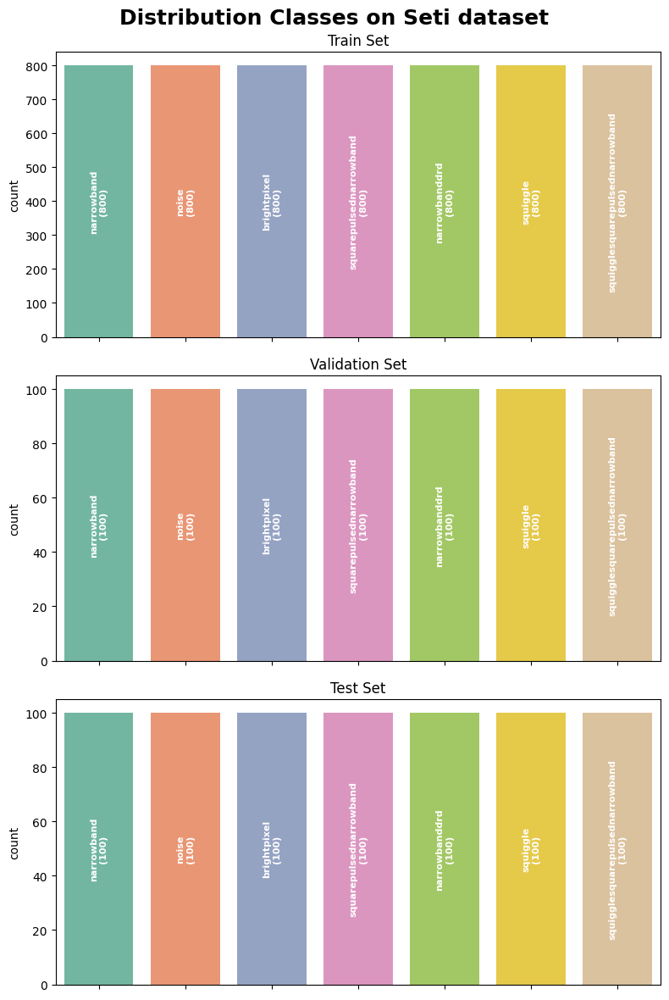

In [8]:
# draw_hist(train_dataset,'train set')
# draw_hist(val_dataset,'val set')
# draw_hist(test_dataset,'test set')

fig, axes = plt.subplots(
    nrows=3,
    ncols=1,
    figsize=(8, 12),
    sharex=True
)

draw_hist_all(train_dataset, "Train Set", axes[0])
draw_hist_all(val_dataset,   "Validation Set", axes[1])
draw_hist_all(test_dataset,  "Test Set", axes[2])

fig.suptitle('Distribution Classes on Seti dataset',fontsize=18,fontweight='bold')

#plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle rect=[left, bottom, right, top]
plt.tight_layout()
plt.show()


In [9]:
train_loader = DataLoader(train_dataset,batch_size=32,shuffle = True)
val_loader = DataLoader(val_dataset,batch_size=32,shuffle = True)
test_loader = DataLoader(test_dataset,batch_size=32,shuffle = False)

In [10]:
import matplotlib.pyplot as plt
from random import randint

def show_images_by_class(dataset, rows=4, cols=7, figsize=(16, 8)):
    """
    Display images in a grid:
    - Each column corresponds to one class
    - Each row shows a different sample of that class
    """

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    fig.subplots_adjust(wspace=0.05, hspace=0.2)

    for j in range(cols):           # column = class
        target_class = j

        for i in range(rows):       # row = sample index

            # Randomly sample until class matches
            while True:
                idx = randint(0, len(dataset)-1)
                image, label = dataset[idx]
                if label.item() == target_class:
                    break

            # --- VISUALIZATION (correct for SETI) ---
            # Convert to intensity map
            img = image.mean(dim=0)   # (H, W)

            axes[i, j].imshow(img) #cmap="viridis"
            # axes[i, j].imshow(image.permute(1,2,0))
            axes[i, j].axis("off")

            # Title only on top row
            if i == 0:
                axes[i, j].set_title(
                    get_classlabels(target_class),
                    fontsize=9
                )

    plt.show()


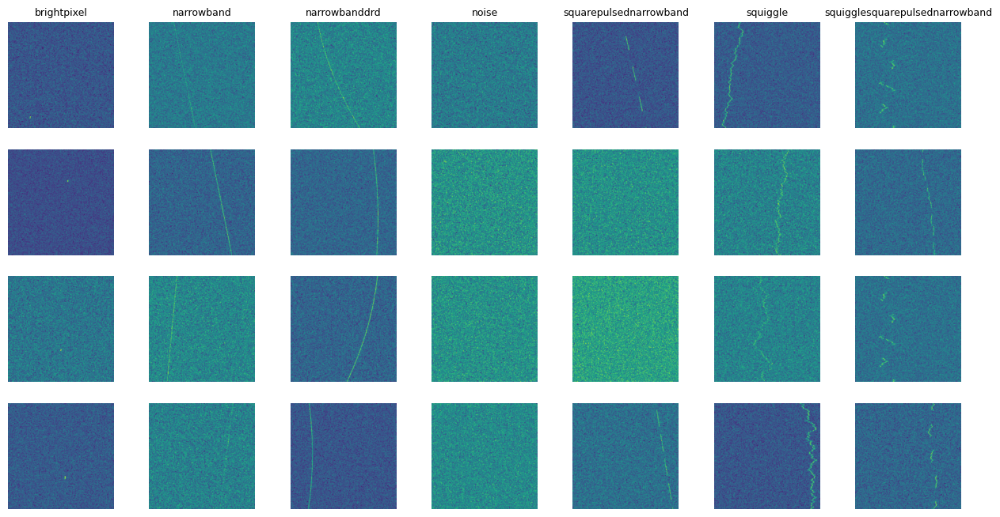

In [11]:
show_images_by_class(train_dataset)

In [12]:
image=train_dataset[0][0]

print(image.shape)        # expect (3, H, W)
print(image[0].mean())    # channel 0
print(image[1].mean())    # channel 1
print(image[2].mean())    # channel 2

torch.Size([3, 224, 224])
tensor(0.4704)
tensor(0.1758)
tensor(0.2678)


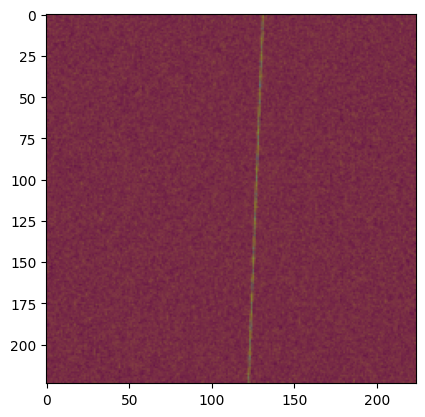

In [13]:
plt.imshow(image.permute(1,2,0))


In [14]:
def save_dataset_labels_to_csv(dataset, csv_path):
    records = []

    for idx in range(len(dataset)):
        _, label = dataset[idx]
        label_int = label.item()
        label_name = get_classlabels(label_int)

        records.append({
            "id": idx,
            "class_id": label_int,
            "class_name": label_name
        })

    df = pd.DataFrame(records)
    df.to_csv(csv_path, index=False)

    print(f"Saved {len(df)} samples to {csv_path}")


In [15]:
def train(model,train_loader,test_loader,optimizer,model_name,num_epochs=10,p=1):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    print(device)

    criterion = nn.CrossEntropyLoss(reduction='mean')
    train_loss_set,test_loss_set = [],[]
    acc_train_set, acc_test_set =[],[]
    best_test_loss = float('inf')

    train_start = time.time()
    for epoch in range(num_epochs):
        model.train()
        total_loss=0.0
        tran_acc_sum=0.0
        all_train_labels,all_train_outputs=[],[]

        for inputs,labels in train_loader:
            inputs,labels = inputs.to(device),labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs,labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            all_train_labels.extend(labels.cpu().detach().numpy())
            outputs = outputs.argmax(dim=1)
            all_train_outputs.extend(outputs.cpu().detach().numpy())
        average_train_loss = total_loss/len(train_loader)

        train_accuracy = accuracy_score(all_train_labels,all_train_outputs)
        train_loss_set.append(average_train_loss)
        acc_train_set.append(train_accuracy)


        model.eval()
        all_test_labels,all_test_preds=[],[]
        with torch.no_grad():
            total_test_loss = 0.0
            for inputs,labels in test_loader:
                inputs,labels = inputs.to(device),labels.to(device)
                outputs = model(inputs)
                _,preds = torch.max(outputs,1)
                all_test_labels.extend(labels.cpu().numpy())
                all_test_preds.extend(preds.cpu().numpy())
                total_test_loss+=criterion(outputs,labels).item()

            average_test_loss = total_test_loss/len(test_loader)
            test_loss_set.append(average_test_loss)
            test_accuracy=accuracy_score(all_test_labels,all_test_preds)
            acc_test_set.append(test_accuracy)
            current_lr = optimizer.param_groups[0]['lr']

            if average_test_loss < best_test_loss:
                best_test_loss = average_test_loss
                torch.save(model.state_dict(),f'model_weights_{model_name}.pth')

            if epoch%p == 0:
                print(f'Epoch {epoch +1}/{num_epochs}: \t Lr:{current_lr}, \t train loss: {average_train_loss:.4f} \t train_acc:{train_accuracy:.4f} \t test_loss:{average_test_loss:.4f}, \t test acc:{test_accuracy:.4f}')
                print('-'*80)

    train_end= time.time()
    time_use = train_end-train_start
    print(f'Time used for training:{time_use} sec')
    print('-'*80)

    report_train = classification_report(all_train_labels,all_train_outputs,target_names=get_class_labels())
    report_test = classification_report(all_test_labels,all_test_preds,target_names=get_class_labels())
    print(f'Training Classification Report :\n {report_train}')
    print(f'Test Classification Report :\n {report_test}')
        
    return model, train_loss_set, test_loss_set, acc_train_set, acc_test_set, time_use

In [16]:
class VGG16(nn.Module):
    def __init__(self,num_classes = 7):
        super(VGG16, self).__init__()
        self.vgg16 = models.vgg16(pretrained=True)
        num_features = self.vgg16.classifier[0].in_features

        self.vgg16.classifier = nn.Sequential(
            nn.Linear(num_features, 4096),
            nn.ReLU(inplace = True),
            nn.Dropout(0.5),
            nn.Linear(4096,4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096,num_classes),
        )

    def forward(self,x):
        return self.vgg16(x)

In [20]:
vgg16=VGG16()
model_name='vgg16pre'
num_epochs=10
p=1
optimizer = optim.Adam(vgg16.parameters(),lr=0.0001,weight_decay=0.001)
model_VGG16, train_loss,test_loss,acc_train,acc_test,time_use =  train(vgg16,train_loader,val_loader,optimizer=optimizer,model_name=model_name,num_epochs=num_epochs,p=p)

cuda
Epoch 1/10: 	 Lr:0.0001, 	 train loss: 0.7584 	 train_acc:0.7232 	 test_loss:0.4975, 	 test acc:0.8029
--------------------------------------------------------------------------------
Epoch 2/10: 	 Lr:0.0001, 	 train loss: 0.4634 	 train_acc:0.8352 	 test_loss:0.3994, 	 test acc:0.8657
--------------------------------------------------------------------------------
Epoch 3/10: 	 Lr:0.0001, 	 train loss: 0.4098 	 train_acc:0.8645 	 test_loss:0.4226, 	 test acc:0.8500
--------------------------------------------------------------------------------
Epoch 4/10: 	 Lr:0.0001, 	 train loss: 0.3447 	 train_acc:0.8880 	 test_loss:0.3827, 	 test acc:0.8814
--------------------------------------------------------------------------------
Epoch 5/10: 	 Lr:0.0001, 	 train loss: 0.3263 	 train_acc:0.8952 	 test_loss:0.4050, 	 test acc:0.8700
--------------------------------------------------------------------------------
Epoch 6/10: 	 Lr:0.0001, 	 train loss: 0.2821 	 train_acc:0.9116 	 test_los

In [25]:
def plot_graph(train_loss_history,test_loss_history,acc_train_loss,acc_test_loss,model_name):
    epochs = range(1,len(train_loss_history)+1)
    fig,(ax1,ax2)=plt.subplots(2,1,figsize=(10,10))
    ax1.plot(epochs,train_loss_history,label='Train Loss')
    ax1.plot(epochs,test_loss_history,label='Val Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title(f'Training and test Loss Over Epochs on {model_name}')
    ax1.legend()

    ax2.plot(epochs,acc_train_loss,label='Train Acc')
    ax2.plot(epochs,acc_test_loss,label='Test Acc')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title(f'Training and test Accuracy Over Epochs on {model_name}')
    ax2.legend()

    plt.tight_layout()
    plt.savefig(f'epochs_on_{model_name}.jpg')
    plt.show()

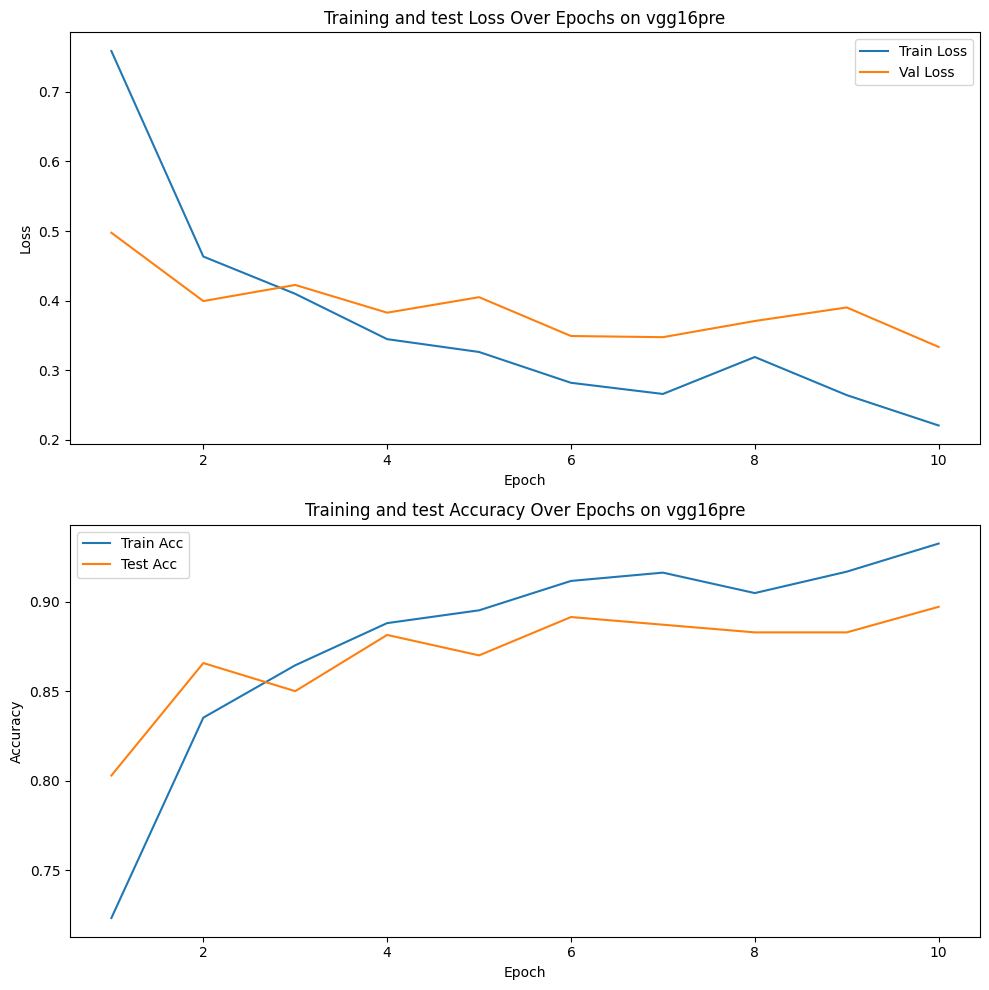

In [26]:
plot_graph(train_loss,test_loss,acc_train,acc_test,model_name)

In [37]:
def test_model(model,test_loader,model_name):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    print(device)

    model.eval
    all_test_labels,all_test_outputs =[],[]
    time_start=time.time()
    for inputs,labels in test_loader:
        inputs,labels = inputs.to(device),labels.to(device)
        outputs=model(inputs)
        _,preds = torch.max(outputs,1)
        all_test_labels.extend(labels.cpu().numpy())
        all_test_outputs.extend(preds.cpu().numpy())
    
    # Save labels and predictions to a DataFrame
    results_df = pd.DataFrame({'True Labels': all_test_labels, 'Predicted Labels': all_test_outputs})
    results_df.to_csv(f'/kaggle/working/test_results_{model_name}.csv', index=False)

    time_end=time.time()
    time_use=time_end-time_start
    report_test = classification_report(all_test_labels,all_test_outputs,target_names=get_class_labels())
    conf_matrix = confusion_matrix(all_test_labels, all_test_outputs)
    print(f'Time use : {time_use} sec')
    print(f'Test Classification Report :\n {report_test}')
    # print(f"Confusion Matrix:\n{conf_matrix}")
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
                xticklabels=[0, 1,2,3,4,5,6], yticklabels=[0, 1,2,3,4,5,6])

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.savefig(f'/kaggle/working/Confusion Matrix on {model_name}.jpg')
    plt.show()
    

In [29]:
# Load the saved parameters
loaded_vgg16_model = VGG16()
loaded_vgg16_model.load_state_dict(torch.load('/kaggle/working/model_weights_vgg16pre.pth'))

<All keys matched successfully>

cuda
Time use : 3.301645040512085 sec
Test Classification Report :
                                 precision    recall  f1-score   support

                   brightpixel       0.90      0.85      0.88       100
                    narrowband       0.78      0.98      0.87       100
                 narrowbanddrd       0.97      0.72      0.83       100
                         noise       0.81      0.86      0.83       100
        squarepulsednarrowband       0.92      0.97      0.94       100
                      squiggle       0.97      0.97      0.97       100
squigglesquarepulsednarrowband       0.96      0.91      0.93       100

                      accuracy                           0.89       700
                     macro avg       0.90      0.89      0.89       700
                  weighted avg       0.90      0.89      0.89       700



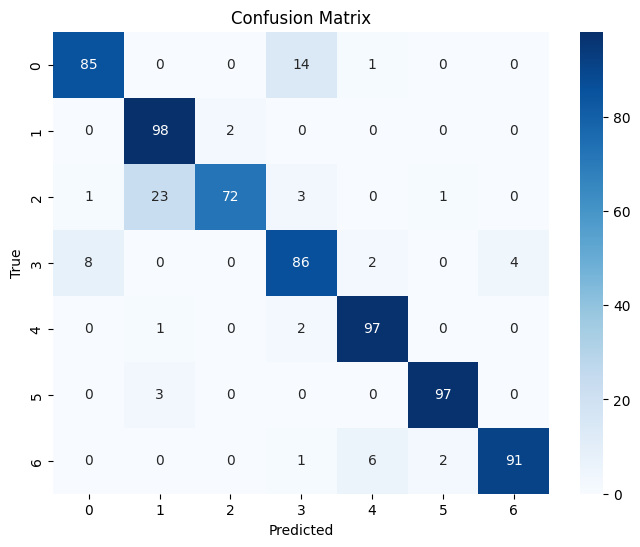

In [38]:
test_model(loaded_vgg16_model,test_loader,'VGG16 pretrained')

In [42]:
def CAM_ALG(model,img):
    device=torch.device('cuda'if torch.cuda.is_available() else 'cpu')
    model.to(device)
     #change img from test_dataset to 4D 
    img = img.unsqueeze(0)#torch.Size([1, 3, 225, 225])
    img = img.to(device)
    #img = Variable(img, requires_grad=True)
    #print(img)
    
    # output of features and predict label
    model.eval()
    features = model.vgg16.features(img) #torch.Size([1, 256, 6, 6])
    output = model.vgg16.classifier(features.flatten())
    print(output)
    #print(output.shape)
    #pred_label= torch.argmax(output).item()
    
    # 为了能读取到中间梯度定义的辅助函数
    def extract(g):
        global features_grad
        features_grad = g
 
    # 预测得分最高的那一类对应的输出score
    pred_label = torch.argmax(output).item()
    pred_class = output[pred_label]
    #print(pred_class)
 
    features.register_hook(extract)
    pred_class.backward() # 计算梯度
    grads = features_grad   # 获取梯度
    #print(grads)
    
    
    # Do Global Aberage Pooling
    GAP_features = torch.nn.functional.adaptive_avg_pool2d(grads,(1,1))
    #print(GAP_features.shape) #torch.Size([1, 256, 1, 1])
    
    #Weight_sum_average on the features and features after GAP
    Weighted_sum = features*GAP_features
    Weighted_sum = Weighted_sum.squeeze().cpu().detach().numpy() #(256, 6, 6)
    cam = np.mean(Weighted_sum, axis=0) #(6, 6)
    #print(cam)
    cam=np.maximum(cam,0)
    #cam/= np.max(cam)
    #print( np.max(np.maximum(cam,0.0001)))
    cam/= np.maximum(np.max(cam),0.00000000001)

    # Resize the CAM to the original image size and Min-Max Normalization
    cam = cv2.resize(cam, (224, 224))
    
    # Apply heatmap to the original image
    heatmap = cv2.applyColorMap(np.uint8(254 * (1 - cam)), cv2.COLORMAP_JET)
    img = np.transpose(img.squeeze().cpu().numpy(), (1, 2, 0))
    heatmap =heatmap/ 254 # tonormalize
    superimposed_img = heatmap * 0.4 + img

    return superimposed_img, pred_label
    

In [43]:
def CAM_visual(model,test_dataset,model_name,list_img):
    f, ax = plt.subplots(2, 4, figsize=(13, 8))
    
    for i,img_id in enumerate(list_img):
        img, label = test_dataset[img_id]
    
        #ori img
        image = img.permute(1, 2, 0)
        ax[0, i].imshow(image)
        ax[0, i].set_title(f'Label: {get_classlabels(label.item())}')
        #img with CAM
        superimposed_img, predict_label = CAM_ALG(model, img)
        cas = ax[1, i].imshow(superimposed_img)#, cmap='jet')#, interpolation='nearest')
        ax[1, i].set_title(f'Predict: {get_classlabels(predict_label)}')

    # Create a colorbar at the bottom
    #cbar_ax = f.add_axes([0.92, 0.15, 0.02, 0.7])
    #plt.colorbar(cas, cax=cbar_ax)
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.suptitle(f'CAM visual On {model_name} model', fontsize=16)
    plt.savefig(f'/kaggle/working/{model_name}compareC.jpg')
    plt.show()

tensor([-3.1862,  4.7262,  2.1206, -3.9556, -1.4428, -0.3384, -3.2273],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-3.6104,  5.7695,  2.8154, -4.8120, -2.0051, -0.5707, -4.0410],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-3.1344,  5.6981,  2.0094, -4.8886, -1.8210, -0.3760, -3.7352],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-4.6084,  6.3077,  3.4463, -5.3651, -1.8541, -0.7498, -4.1741],
       device='cuda:0', grad_fn=<ViewBackward0>)


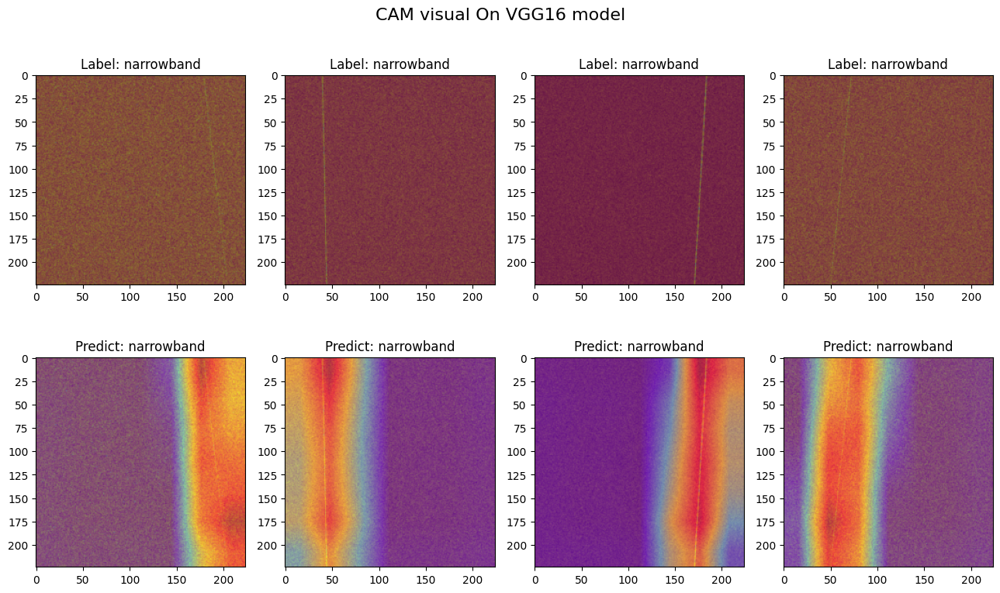

In [46]:
model_name ='VGG16'
list_img=[45,20,53,67]
CAM_visual(loaded_vgg16_model,test_dataset,model_name,list_img)

tensor([ 0.1960, -3.5823, -0.3876,  3.2001,  0.3247, -2.4453,  0.1120],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([ 0.9336, -3.8646, -0.0620,  4.1986,  0.5869, -3.6161, -1.0475],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([ 2.2396, -4.1449, -1.1180,  3.5196,  0.8226, -3.6395, -0.7263],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([ 0.3447, -3.6118, -0.9492,  2.4256,  0.7253, -2.1413,  0.9363],
       device='cuda:0', grad_fn=<ViewBackward0>)


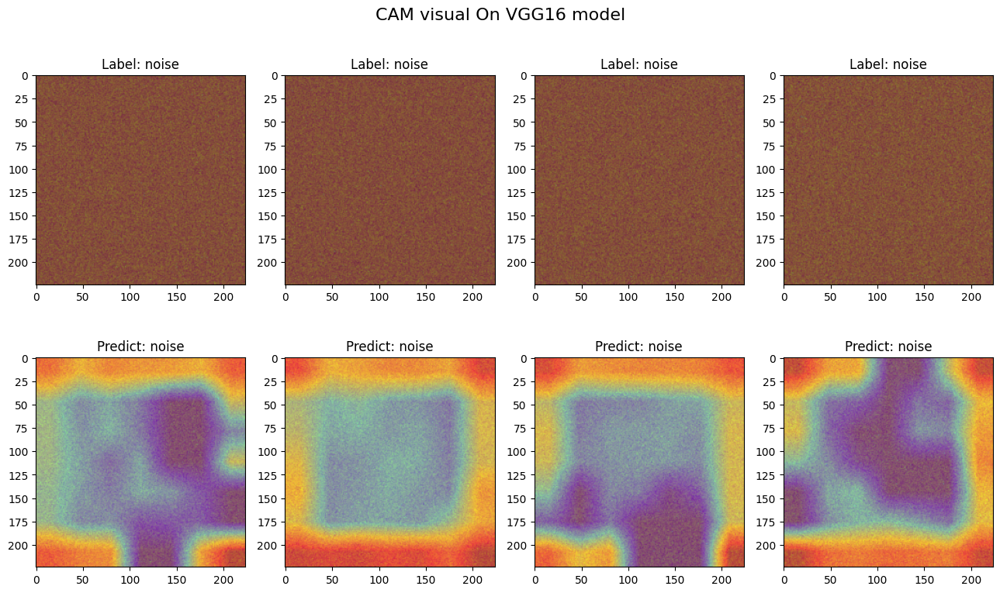

In [47]:
model_name ='VGG16'
list_img=[102,130,156,187]
CAM_visual(loaded_vgg16_model,test_dataset,model_name,list_img)

tensor([ 1.3199, -3.8453, -0.4395,  4.0500,  0.6358, -3.6079, -0.9476],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([11.3702, -4.7272, -3.6274, -1.9150,  0.9034, -6.0091, -3.3819],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([12.0569, -4.8811, -3.6522, -1.8882,  0.1277, -5.8372, -3.2918],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([ 21.0640,  -9.0846,  -7.3143,  -6.5326,   4.4079, -12.0862,  -4.9832],
       device='cuda:0', grad_fn=<ViewBackward0>)


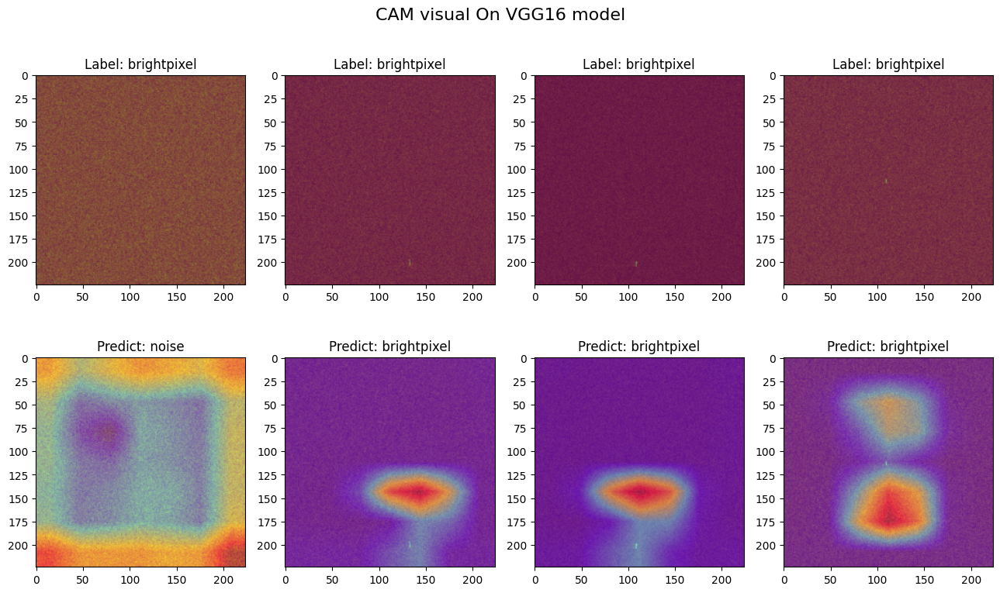

In [48]:
model_name ='VGG16'
list_img=[202,230,256,287]
CAM_visual(loaded_vgg16_model,test_dataset,model_name,list_img)

tensor([-4.5659, -2.0551, -3.0014, -4.7514,  8.9018, -3.1552,  2.8602],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-5.6800, -1.0715, -3.0891, -6.8187, 11.0928, -4.5788,  2.1299],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-3.2602, -1.8957, -2.5879, -3.9168,  7.1834, -2.8095,  2.6056],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-5.0764, -2.8748, -2.5699, -4.9849,  9.9279, -3.9639,  2.9875],
       device='cuda:0', grad_fn=<ViewBackward0>)


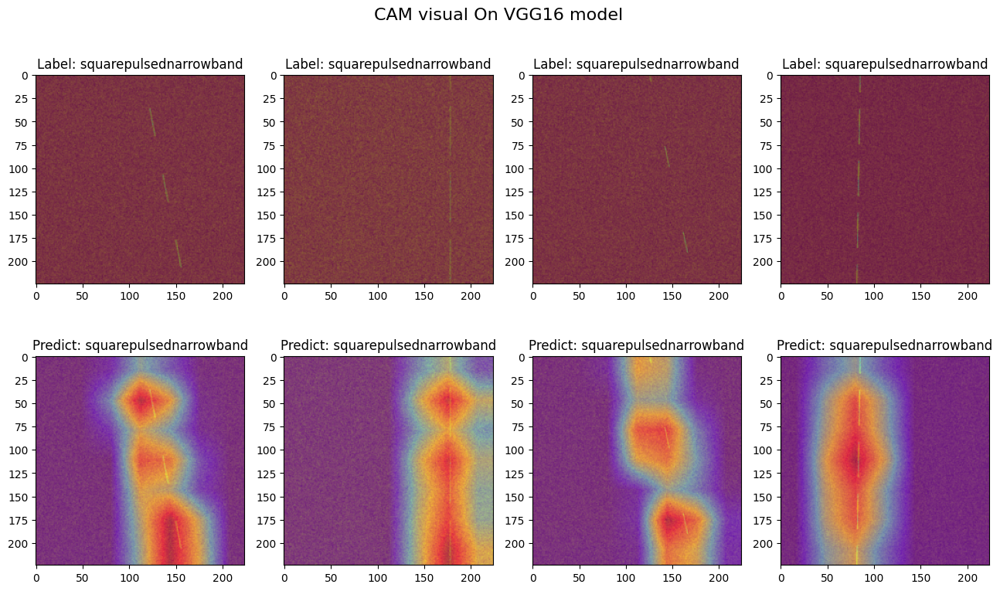

In [49]:
model_name ='VGG16'
list_img=[302,330,356,387]
CAM_visual(loaded_vgg16_model,test_dataset,model_name,list_img)

tensor([-8.0129, -2.4005, 12.9605, -4.0207, -3.7238, -1.4344, -4.1291],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-3.8220,  1.8896,  5.0316, -2.7792, -1.5743, -0.7819, -2.9147],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-6.0261, -2.6025, 10.0673, -2.0226, -2.5071, -2.4308, -3.3016],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-1.4866, -0.8350,  1.9737,  1.3380, -0.3754, -1.9388, -1.7775],
       device='cuda:0', grad_fn=<ViewBackward0>)


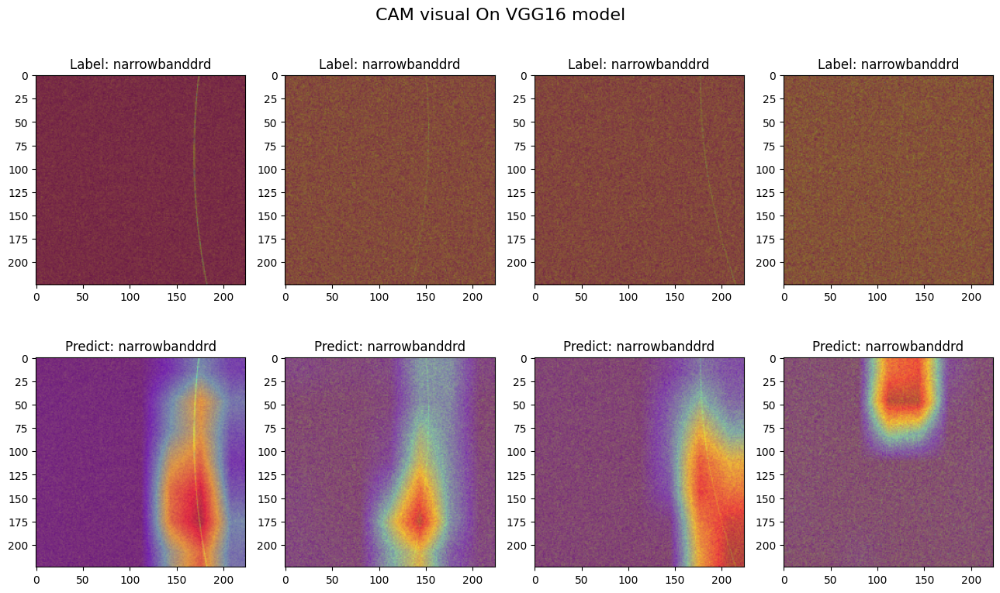

In [50]:
model_name ='VGG16'
list_img=[402,430,456,487]
CAM_visual(loaded_vgg16_model,test_dataset,model_name,list_img)

tensor([-9.9940, -4.2190, -2.5912, -9.1794, -7.3309, 16.7572,  0.5635],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-10.0899,  -2.6326,  -3.0998, -11.5230,  -7.3616,  18.3923,  -1.7100],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-11.3080,  -4.4416,  -3.5184, -11.8318,  -8.2641,  20.6646,  -0.6193],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-19.2568,  -2.6851,  -5.0448, -19.5861, -12.9419,  30.6347,  -1.2901],
       device='cuda:0', grad_fn=<ViewBackward0>)


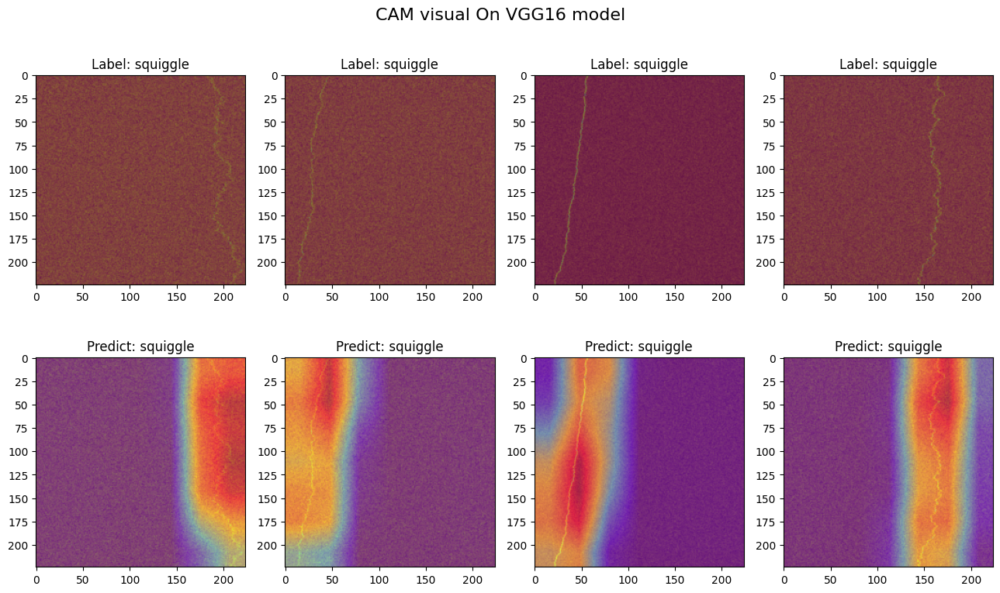

In [51]:
model_name ='VGG16'
list_img=[502,530,556,587]
CAM_visual(loaded_vgg16_model,test_dataset,model_name,list_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08235294371843338..1.0094179637788787].


tensor([-3.6751, -8.2729, -4.9019, -2.2191,  3.2536, -1.4987, 11.1134],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([ -9.4901, -15.6668, -10.1020,  -6.1098,   2.2152,  -0.2861,  24.6632],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-13.6074, -19.4441, -12.3939,  -8.0373,   3.8281,  -0.1752,  31.1744],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-2.4428, -2.0276, -1.8456, -2.9362,  5.9746, -2.6557,  1.9751],
       device='cuda:0', grad_fn=<ViewBackward0>)


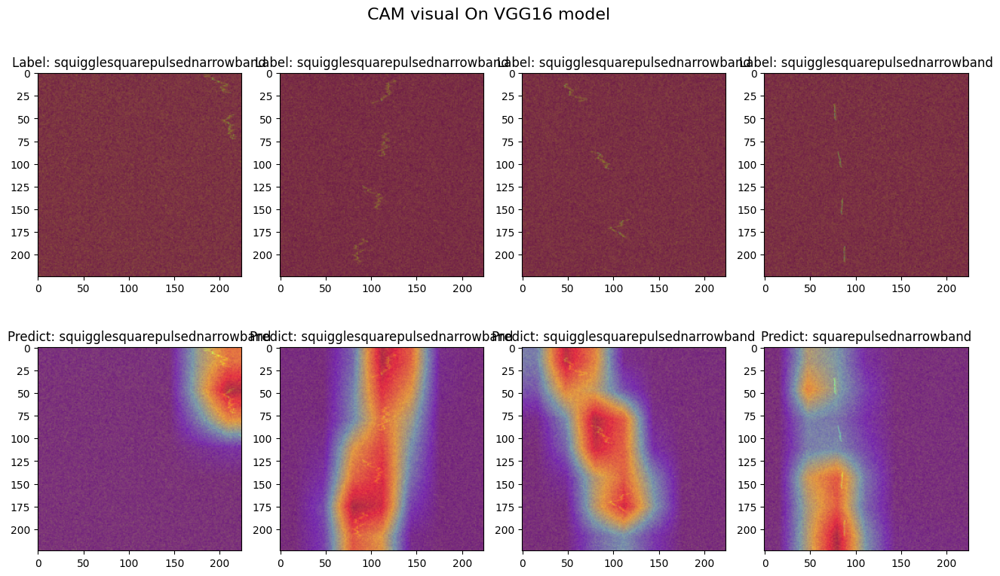

In [52]:
model_name ='VGG16'
list_img=[602,630,656,687]
CAM_visual(loaded_vgg16_model,test_dataset,model_name,list_img)

tensor([-5.6573, -1.1877, 10.0517, -2.1645, -3.1842, -2.1801, -4.5682],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-14.5481,  -5.6581,  -4.3806, -14.6053, -10.4940,  26.3815,  -1.0051],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([ -9.3394, -15.2925,  -8.5292,  -3.8547,   6.8738,  -3.5260,  21.6368],
       device='cuda:0', grad_fn=<ViewBackward0>)
tensor([-16.6883, -24.0132, -16.1083, -13.3375,   3.9808,   3.0645,  38.4080],
       device='cuda:0', grad_fn=<ViewBackward0>)


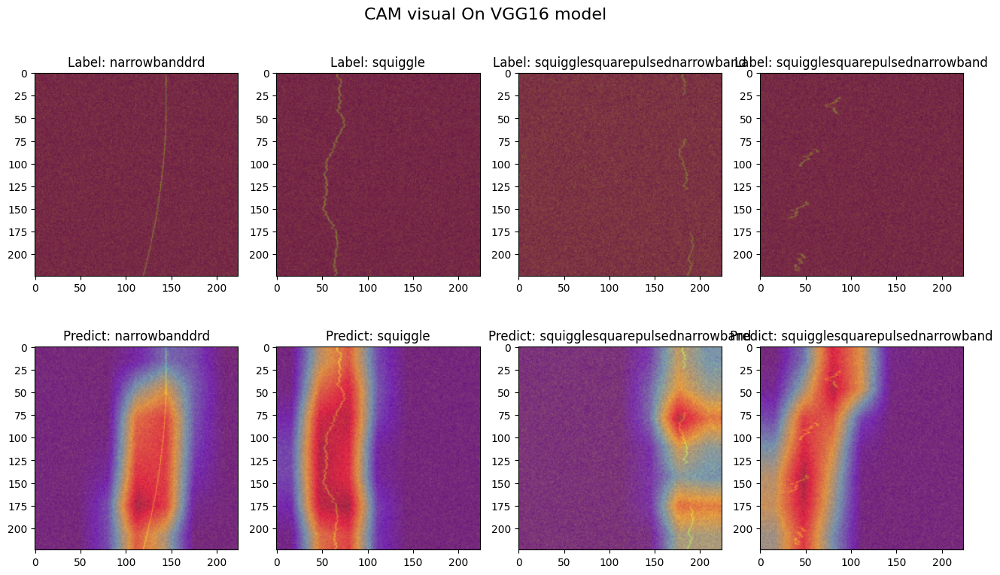

In [45]:
model_name ='VGG16'
list_img=[432,521,632,675]
CAM_visual(loaded_vgg16_model,test_dataset,model_name,list_img)